# Supervised Autoencoder on CIFAR-10 — Notebook Template

**Goal:** Train a supervised autoencoder (reconstruction + classification) on CIFAR-10

## Environment & Reproducibility



In [1]:
import os
import math
import random
from pathlib import Path
import numpy as np
import random
import torch
import torchvision

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

Device: cuda


## Config


In [2]:
# TODO: create a minimal config
CONFIG = {
    # ---------- Data ----------
    'data_root'        : '../data_02',
    'num_classes'      : 10,
    'batch_size'       : 128,
    'augment'          : True,          # basic flips/crops/etc.
    'num_workers'      : 4,
    'img_size'         : 32,            # CIFAR-10 native
    'split_train'      : 0.8,           # 0.8 train / 0.2 val (renamed from split_val for clarity)

    # ---------- Model ----------
    'latent_dim'       : 128,            # range:{32, 64, 128}
    'loss_type'        : 'mse',          # reconstruction: 'mse' or 'bce' -> mse is best
    'lambda_recon'     : 50,             # range {0.1, 0.25, 1, 5, 10, 50}
    "latent_noise_std" : 0.1,              # std of Gaussian noise in latent space (train-time only)
                                         # 0.0 → deterministic, no nois
                                         # 0.02–0.05 → gentle smoothing (usually best)
                                         # 0.1+ → stronger noise, can hurt reconstruction slightly but help generalization
    # ---------- Optimizer ----------
    'lr'               : 5e-4,          # tuning range 1e-3, 1e-5
    'weight_decay'     : 0,             # built-in L2 regularization (weight_decay): 1e-4

    # ---------- Training loop ----------
    'epochs'           : 60,            # -> int, number of epochs   
}

from pprint import pprint
pprint(CONFIG)

{'augment': True,
 'batch_size': 128,
 'data_root': '../data_02',
 'epochs': 60,
 'img_size': 32,
 'lambda_recon': 50,
 'latent_dim': 128,
 'latent_noise_std': 0.1,
 'loss_type': 'mse',
 'lr': 0.0005,
 'num_classes': 10,
 'num_workers': 4,
 'split_train': 0.8,
 'weight_decay': 0}


## Data Pipeline (CIFAR-10)


In [3]:
# TODO: write the strategy to explain the no normalization
from typing import Tuple
import torchvision.transforms as T
from torchvision.datasets import CIFAR10
from torch.utils.data import DataLoader, Subset, random_split

def get_transforms(augment: bool = True):
    
    train_tfms = T.Compose([
        T.RandomCrop(32, padding=4),
        T.RandomHorizontalFlip(),
        T.ToTensor(),
        ])
    
    test_val_tfms = T.Compose([
            T.ToTensor(),
        ])
    
    if augment is True:
        return train_tfms, test_val_tfms
    
    else:
        train_tfms = test_val_tfms
        return train_tfms, test_val_tfms
        
def get_dataloaders(cfg) -> Tuple[object, object, object]:

    train_tfms, test_tfms = get_transforms(cfg['augment'])
    
    # Instantiate the dataset
    test_set = CIFAR10(root=cfg['data_root'], train=False, transform= test_tfms, download = True)
    
    augment_train_set = CIFAR10(root=cfg['data_root'], train=True, transform= train_tfms, download = True)
    no_augment_train_set = CIFAR10(root=cfg['data_root'], train=True, transform= test_tfms, download = True)
    
    # split the full training data into train and validation sets
    train_size: int = int(cfg['split_train'] * len(augment_train_set))
    valid_size: int = len(augment_train_set) - train_size
    
    # get the list of indices
    dataset_indices = list(range(0, len(augment_train_set))) 

    random.seed(SEED)  
    shuffled_dataset_indices = random.sample(dataset_indices , k=len(dataset_indices))
    
    train_idx = shuffled_dataset_indices[:train_size]
    val_idx = shuffled_dataset_indices[train_size:]
    
    # Get the train_set and valid_set    
    train_set = Subset(dataset= augment_train_set, indices= train_idx)
    valid_set = Subset(dataset= no_augment_train_set, indices= val_idx)       
    
    # Instantiate the DataLoaders
    train_loader = DataLoader(
        dataset=train_set,
        batch_size=cfg["batch_size"],
        shuffle=True,               # always shuffle training data
        drop_last=True,             # optional but recommended for batchnorm stability
        pin_memory=True,            # speeds up transfers to GPU
        persistent_workers=True,    # avoids worker respawn overhead (if num_workers>0)
        num_workers=cfg["num_workers"]
    )
    
    valid_loader = DataLoader(
        dataset=valid_set,
        batch_size=cfg["batch_size"],
        shuffle=False,              # never shuffle validation data
        drop_last=False,
        pin_memory=True,
        persistent_workers=True, 
        num_workers=cfg["num_workers"]
    )
    
    test_loader = DataLoader(
        dataset=test_set,
        batch_size=cfg["batch_size"],
        shuffle=False,
        drop_last=False,
        pin_memory=True,
        persistent_workers=True,
        num_workers=cfg["num_workers"]
    )
    
    # print dataset sizes
    print(f"All samples: {len(train_set)+len(valid_set)+len(test_set)}")
    print(f"Train samples: {len(train_set)}")
    print(f"Validation samples: {len(valid_set)}")
    print(f"Test samples: {len(test_set)}")

    # get one sample to check image shape
    image, label = augment_train_set[0]
    print(f"Single image shape: {image.shape}")
    
    return train_loader, valid_loader,test_loader

# Get the dataloader
train_loader, valid_loader,test_loader = get_dataloaders(CONFIG)
images, labels = next(iter(train_loader))

print(
    f"\n[INFO] Dataset summary:\n"
    f"       Images shape : {images.shape}\n"
    f"       Labels shape : {labels.shape}\n"
    f"       Pixel range  : [{images.min().item()}, {images.max().item()}]"
)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
All samples: 60000
Train samples: 40000
Validation samples: 10000
Test samples: 10000
Single image shape: torch.Size([3, 32, 32])

[INFO] Dataset summary:
       Images shape : torch.Size([128, 3, 32, 32])
       Labels shape : torch.Size([128])
       Pixel range  : [0.0, 1.0]


## View a batch of images

In [4]:
# TODO: Get the label directly cifar10_classes = cifar10.classes

cifar10_classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

print(cifar10_classes [labels[0]])  

car


Shape before transpose: (3, 546, 274)
Shape after transpose: (546, 274, 3)


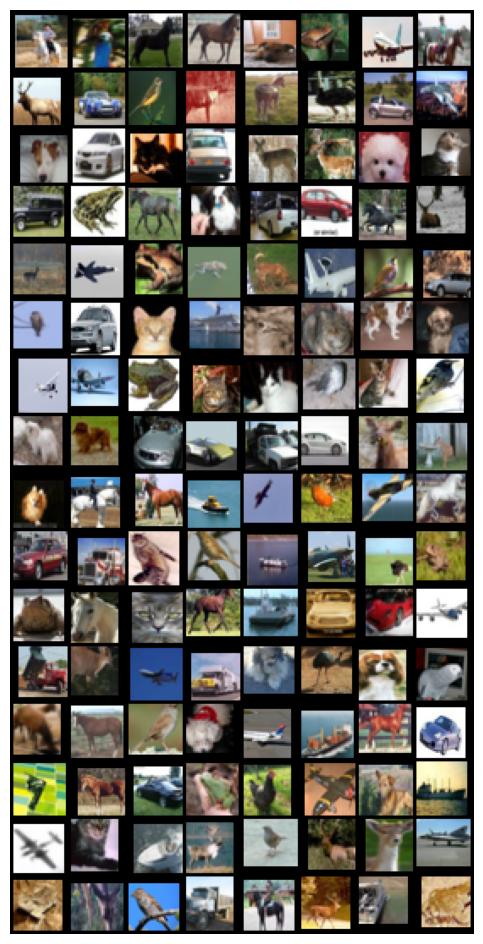

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# TODO: check the bug -> it is not an 8 by 8 figure, why?
# Helper function to display an image grid
def show_image(image_tensor: torch.Tensor) -> None:
    """Convert a PyTorch tensor into a viewable image grid and show it."""

    # Step 1 Undo normalization: normalised = (original - 0.5) / 0.5] -> normalised * 2 +0.5 = original
    # unnormalized_image_grid = image_tensor * 0.5 + 0.5

    # Step 2: Convert from a PyTorch tensor to a NumPy array (for matplotlib)
    # .detach() removes gradient tracking; .cpu() ensures data is on the CPU.
    image_grid_C_H_W = image_tensor.detach().cpu().numpy()
    
    print("Shape before transpose:", image_grid_C_H_W.shape)  
    # (C, H, W) → C = number of color channels (3 for RGB), H = height, W = width

    # Step 3: Rearrange dimensions from (C, H, W) to (H, W, C)
    # because Matplotlib expects the color channel as the last dimension.
    image_grid_H_W_C = np.transpose(image_grid_C_H_W, (1, 2, 0))
    print("Shape after transpose:", image_grid_H_W_C.shape)   # (H, W, C)

    # Step 4: Display the image
    plt.figure(figsize=(12, 12))
    plt.imshow(image_grid_H_W_C)
    plt.axis("off")  # hide axis numbers
    plt.show()
    
# Get a batch of training images
data_iter: iter = iter(train_loader)  # Create an iterator for the DataLoader
images: torch.Tensor
labels: torch.Tensor
images, labels = next(data_iter)   # Get one batch (images + labels)

# Make a grid from the batch
image_grid: torch.Tensor = torchvision.utils.make_grid(images, nrow=8)  # 8 images per row


# Show the grid
show_image(image_grid)

## Model — Encoder, Decoder, Classifier Head, SupervisedAE

In [6]:
import torch
import torch.nn as nn
from torch.nn.utils import clip_grad_norm_
from torchmetrics.classification import MulticlassAccuracy
from torchmetrics import MeanSquaredError

### Encoder and decoder 

In [7]:
import torch.nn as nn

class Encoder(nn.Module):
    def __init__(self, latent_dim: int = 64, latent_noise_std: float = 0.0):
        super().__init__()
        self.latent_noise_std = latent_noise_std
        #  conv → bn → relu blocks with downsampling to small spatial map
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),
        )
        # 32→16→8→4
        self.flat_dim = 128*4*4 # = 2048
                
        # Learnable linear projection: compress 2048-dim feature vector → latent_dim embedding (bottleneck)
        self.features_to_latent = nn.Linear(self.flat_dim, latent_dim)
        
    def forward(self, x):
        # return z the latent vector of shape (B, latent_dim)
        features = self.encoder_cnn(x)
        features_flat = features.flatten(1)
        z = self.features_to_latent(features_flat)
        # # TODO: add in config
        if self.training and self.latent_noise_std > 0.0:
            z = z + torch.randn_like(z) * self.latent_noise_std  # Gaussian noise
        return z

In [8]:
class Decoder(nn.Module):
    def __init__(self, latent_dim: int = 64):
        super().__init__()
        # linear → reshape → convtranspose blocks back to (B,3,32,32)
        
        self.flat_dim = 128*4*4 # = 2048
        
        self.latent_to_features = nn.Linear(latent_dim, self.flat_dim, )
        
        self.decoder_cnn = nn.Sequential(
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=64),
            nn.GELU(),
            # nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=4, stride=2,padding=1, bias=False),
            nn.BatchNorm2d(num_features=32),
            nn.GELU(),
            # nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(in_channels=32, out_channels=3, kernel_size=4, stride=2, padding=1, bias=True),
            nn.Sigmoid()
        )

    def forward(self, z):
        # z: (B, latent_dim)
        # output: reconstructed image (B, 3, 32, 32)
        x = self.latent_to_features(z).reshape(z.size(0), 128, 4, 4) 
        x_hat = self.decoder_cnn(x)

        return x_hat

In [9]:
# Check: Encoder class
random_tensor = torch.rand(size = (8, 3, 32, 32))
encoder_trial = Encoder(latent_dim = 64)
latent_vector = encoder_trial.forward(random_tensor)
print("expected latent vector shape:",latent_vector.shape)

# Check: Decoder class
decoder_trial = Decoder()
recon_tensor = decoder_trial.forward(latent_vector)
print("expected reconstructed shape:", recon_tensor.shape)

expected latent vector shape: torch.Size([8, 64])
expected reconstructed shape: torch.Size([8, 3, 32, 32])


### Classifier

In [46]:
import torch.nn as nn

class ClassifierHead(nn.Module):
    def __init__(self, latent_dim: int = 64, num_classes: int = 10):
        super().__init__()
        self.hidden_dim = 256  # tuning range: 64, 128, 256, small, expressive hidden layer
        
        # Simple MLP: z → hidden → logits
        self.mlp = nn.Sequential(
            nn.Linear(latent_dim, self.hidden_dim),
            nn.BatchNorm1d(self.hidden_dim),  # normalize 2D features
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),  # tuning range: 0, 0.5
            nn.Linear(self.hidden_dim, num_classes)  # outputs raw logits for 10 classes
        )

    def forward(self, z):
        # Return logits (no softmax — handled by CrossEntropyLoss)
        logits = self.mlp(z)
        return logits

In [11]:
z = torch.randn(8, 64)
head = ClassifierHead(64, 10)
logits = head(z)
print(logits.shape)  # should be (8, 10)


torch.Size([8, 10])


### Supervised autoencoder

In [43]:
import torch
import torch.nn as nn

class SupervisedAE(nn.Module):
    def __init__(self, latent_dim: int = 64, num_classes: int = 10, lambda_recon: float = 0.25, latent_noise_std: float = 0):
        super().__init__()
        self.latent_noise_std = latent_noise_std
        # STEP 1 — Instantiate submodules
        # Encoder: takes (B,3,32,32) → (B, latent_dim)
        self.encoder = Encoder(latent_dim=latent_dim, latent_noise_std=latent_noise_std) 
        
        # Decoder: takes (B, latent_dim) → (B,3,32,32) with values in [0,1]
        self.decoder = Decoder(latent_dim=latent_dim) 
        
        # ClassifierHead: takes (B, latent_dim) → (B, num_classes) logits
        self.head = ClassifierHead(latent_dim=latent_dim, num_classes=num_classes)

        # STEP 2 — (Optional) Save hyperparameters you’ll want later (e.g., for loss weighting)
        self.latent_dim   = latent_dim
        self.num_classes  = num_classes
        self.lambda_recon = lambda_recon
        
    def forward(self, x):
        """
        Define the forward pass
          Input:
            x : tensor of shape (B, 3, 32, 32) with values in [0,1]
          Returns:
            z       : (B, latent_dim)      — latent representation
            x_hat   : (B, 3, 32, 32)       — reconstruction in [0,1]
            logits  : (B, num_classes)     — unnormalized class scores
        """
        # Encode image to latent
        z = self.encoder(x)

        # Decode latent back to image
        x_hat = self.decoder(z)

        # Classify from the same latent (no detach — let gradients flow into encoder)
        logits = self.head(z)

        # 4d) Return all three for downstream loss computation / metrics
        return z, x_hat, logits

## Loss functions

In [13]:
import torch.nn as nn
import torch.nn.functional as F

def reconstruction_loss(x_hat, x, loss_type='mse'):
    """
    Compute reconstruction loss between model output and input.
    loss_type: 'mse' or 'bce' (extendable).
    """
    if loss_type == 'mse':
        return F.mse_loss(x_hat, x)
    elif loss_type == 'bce':
        return F.binary_cross_entropy(x_hat, x)
    else:
        raise NotImplementedError(f"Loss type '{loss_type}' not implemented.")


def classification_loss(logits, y):
    """
    Compute classification loss (CrossEntropyLoss expects raw logits).
    """
    return F.cross_entropy(logits, y)


def total_loss(logits, x_hat, y, x, lambda_recon: float = 0.25, loss_type='mse'):
    """
    Combine classification and reconstruction losses.
    Returns total loss, classification loss, and reconstruction loss.
    """
    recon_loss = reconstruction_loss(x_hat, x, loss_type)
    cls_loss   = classification_loss(logits, y)
    total_loss = cls_loss + lambda_recon * recon_loss 
    
    return total_loss

# Training Loop
- [ ] Build optimizer + (optional) scheduler
- [ ] Train for N epochs, log running losses & accuracy
- [ ] Validate each epoch; keep best checkpoint

**Verify:** both CE and recon losses decrease; accuracy > random.

https://github.com/ageron/handson-mlp/blob/main/18_autoencoders_gans_and_diffusion_models.ipynb

In [14]:
import torchmetrics

@torch.no_grad()
def evaluate(model, loader, device, loss_type):
    model.eval()
    acc = MulticlassAccuracy(num_classes=model.num_classes).to(device)
    rmse = MeanSquaredError(squared=False).to(device)
    tot_loss = 0.0
    for X, y in loader:
        X, y = X.to(device), y.to(device)
        _, x_hat, logits = model(X)
        loss = total_loss(logits, x_hat, y, X, model.lambda_recon, loss_type)
        tot_loss += loss.item()
        acc.update(logits, y)      # logits ok; argmax applied internally
        rmse.update(x_hat, X)
    n = len(loader)
    return {
        "loss": tot_loss / n,
        "acc": acc.compute().item(),
        "rmse": rmse.compute().item(),
    }

def train(model, optimizer, train_loader, valid_loader, n_epochs=10, device=None,
          max_grad_norm=1.0, scheduler_patience=2, scheduler_factor=0.5, loss_type='mse'):
    
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    acc_tm = MulticlassAccuracy(num_classes=model.num_classes).to(device)
    rmse_tm = MeanSquaredError(squared=False).to(device)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", patience=scheduler_patience, factor=scheduler_factor
    )

    history = {"train_loss": [], "train_acc": [], "train_rmse": [],
               "val_loss": [], "val_acc": [], "val_rmse": []}

    for epoch in range(1, n_epochs + 1):
        model.train()
        acc_tm.reset(); rmse_tm.reset()
        running = 0.0

        for X, y in train_loader:
            X, y = X.to(device), y.to(device)
            z, x_hat, logits = model(X)
                        
            # Regularization strength (tune between 1e-4 and 1e-2)
            l1_loss = 5e-2 * z.abs().mean()  # penalize large activations
            
            loss = total_loss(logits, x_hat, y, X, model.lambda_recon, loss_type)
                        
            # Add the L1 regularization term
            loss = loss + l1_loss

            optimizer.zero_grad(set_to_none=True)
            loss.backward()
            clip_grad_norm_(model.parameters(), max_norm=max_grad_norm)
            optimizer.step()

            running += loss.item()
            acc_tm.update(logits, y)
            rmse_tm.update(x_hat, X)

        train_loss = running / len(train_loader)
        train_acc = acc_tm.compute().item()
        train_rmse = rmse_tm.compute().item()

        # ---- validation
        val_metrics = evaluate(model, valid_loader, device, loss_type)
        scheduler.step(val_metrics["acc"])  # plateau on validation accuracy

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["train_rmse"].append(train_rmse)
        history["val_loss"].append(val_metrics["loss"])
        history["val_acc"].append(val_metrics["acc"])
        history["val_rmse"].append(val_metrics["rmse"])

        print(f"Epoch {epoch:02d}/{n_epochs} | "
              f"train: loss {train_loss:.4f}, acc {train_acc:.3f}, rmse {train_rmse:.4f} | "
              f"val: loss {val_metrics['loss']:.4f}, acc {val_metrics['acc']:.3f}, rmse {val_metrics['rmse']:.4f}")

    return history

## Hyperparameters explorations

In [15]:
# ==== Optuna hyperparameter search (single objective) ====
# pip install optuna  # if not installed

import optuna
import torch
import numpy as np
import random

# ---- choose target: "accuracy" (maximize) OR "val_rmse" (minimize) ----
# selection_metric = "accuracy"   # or "val_rmse"
selection_metric = "val_rmse"   # or "accuracy"
direction = "maximize" if selection_metric == "accuracy" else "minimize"

# ---- fewer epochs during search (speed-up) ----
SEARCH_EPOCHS = min(10, CONFIG.get("epochs", 60))

def objective(trial: optuna.Trial):
    # --- search space ---
    latent_dim       = trial.suggest_categorical("latent_dim", [32, 64, 128])
    lambda_recon     = trial.suggest_float("lambda_recon", 0.05, 50, log=True) # 0.1, 0.25, 1, 5, 10, 50
    latent_noise_std = trial.suggest_float("latent_noise_std", 0.0, 0.1)
    lr               = trial.suggest_float("lr", 1e-4, 1e-3, log=True)

    # --- model & optimizer ---
    model = SupervisedAE(
        latent_dim=latent_dim,
        num_classes=CONFIG["num_classes"],
        lambda_recon=lambda_recon,
        latent_noise_std=latent_noise_std,
    )
    optimizer = torch.optim.NAdam(
        model.parameters(),
        lr=lr,
        weight_decay=CONFIG.get("weight_decay", 0.0)
    )

    # --- train for SEARCH_EPOCHS ---
    history = train(
        model, optimizer,
        train_loader, valid_loader,
        n_epochs=SEARCH_EPOCHS,
        loss_type=CONFIG.get("loss_type", "mse")
    )

    # --- take last-epoch validation metrics ---
    last_val_acc  = float(history["val_acc"][-1])
    last_val_rmse = float(history["val_rmse"][-1])

    # log for inspection
    trial.set_user_attr("val_acc", last_val_acc)
    trial.set_user_attr("val_rmse", last_val_rmse)

    # --- return the chosen metric ---
    return last_val_acc if selection_metric == "accuracy" else last_val_rmse

# ---- run Optuna ----
study = optuna.create_study(direction=direction, sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=25, show_progress_bar=True)

# ---- best trial info ----
print("Best trial:")
print("  value:", study.best_value)
print("  params:", study.best_params)
print("  val_acc:", study.best_trial.user_attrs.get("val_acc"))
print("  val_rmse:", study.best_trial.user_attrs.get("val_rmse"))

[I 2025-10-24 00:45:38,438] A new study created in memory with name: no-name-1ace46e5-38ac-48a3-a095-69a0d6098c94


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch 01/10 | train: loss 1.9223, acc 0.362, rmse 0.2122 | val: loss 1.5242, acc 0.486, rmse 0.1737
Epoch 02/10 | train: loss 1.5746, acc 0.467, rmse 0.1644 | val: loss 1.3711, acc 0.530, rmse 0.1581
Epoch 03/10 | train: loss 1.4462, acc 0.509, rmse 0.1536 | val: loss 1.2819, acc 0.564, rmse 0.1520
Epoch 04/10 | train: loss 1.3607, acc 0.541, rmse 0.1475 | val: loss 1.2297, acc 0.584, rmse 0.1485
Epoch 05/10 | train: loss 1.2872, acc 0.569, rmse 0.1435 | val: loss 1.1656, acc 0.604, rmse 0.1452
Epoch 06/10 | train: loss 1.2346, acc 0.590, rmse 0.1405 | val: loss 1.1140, acc 0.629, rmse 0.1435
Epoch 07/10 | train: loss 1.1889, acc 0.604, rmse 0.1379 | val: loss 1.0364, acc 0.654, rmse 0.1404
Epoch 08/10 | train: loss 1.1481, acc 0.619, rmse 0.1359 | val: loss 1.0522, acc 0.648, rmse 0.1389
Epoch 09/10 | train: loss 1.1133, acc 0.631, rmse 0.1345 | val: loss 0.9870, acc 0.672, rmse 0.1384
Epoch 10/10 | train: loss 1.0839, acc 0.643, rmse 0.1329 | val: loss 0.9717, acc 0.681, rmse 0.1371


In [16]:
# ---- update CONFIG ----
CONFIG["latent_dim"]       = int(study.best_params["latent_dim"])
CONFIG["lambda_recon"]     = float(study.best_params["lambda_recon"])
CONFIG["latent_noise_std"] = float(study.best_params["latent_noise_std"])
CONFIG["lr"]               = float(study.best_params["lr"])

print("\nCONFIG updated:")
for k in ["latent_dim", "lambda_recon", "latent_noise_std", "lr"]:
    print(f"  {k}: {CONFIG[k]}")


CONFIG updated:
  latent_dim: 128
  lambda_recon: 49.02237470049679
  latent_noise_std: 0.07631100459156767
  lr: 0.0005362304731503488


## Training model with best hyperparameters

In [45]:
# Instantiate the model
ae_model = SupervisedAE(latent_dim=CONFIG['latent_dim'], num_classes=CONFIG['num_classes'], lambda_recon=CONFIG['lambda_recon'], latent_noise_std=CONFIG['latent_noise_std'])

print(ae_model.latent_noise_std)

# Optimiser
optimizer = torch.optim.NAdam(ae_model.parameters(), lr=CONFIG['lr'], weight_decay=CONFIG['weight_decay'])

# Train
history = train(ae_model, optimizer, train_loader, valid_loader, n_epochs=CONFIG['epochs'], loss_type=CONFIG['loss_type'])

0.07631100459156767


RuntimeError: mat1 and mat2 shapes cannot be multiplied (128x128 and 256x10)

## Plot of accuracy, loss and rmse

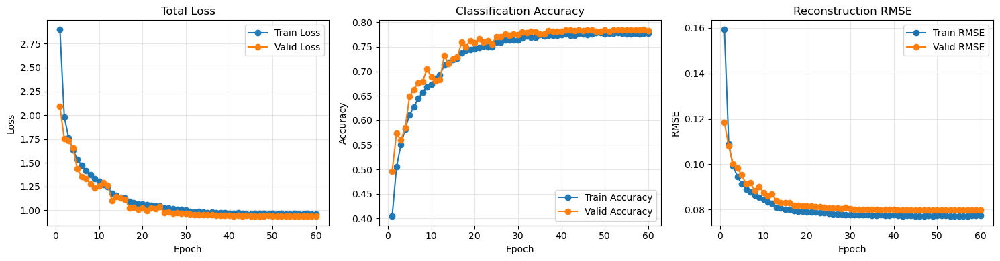

In [18]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    """
    Plot training vs validation curves for loss, accuracy, and RMSE.
    Expects a `history` dict from the `train()` function.
    """
    epochs = range(1, len(history["train_loss"]) + 1)

    plt.figure(figsize=(15, 4))

    # ---- 1. Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs, history["train_loss"], label="Train Loss", marker="o")
    plt.plot(epochs, history["val_loss"], label="Valid Loss", marker="o")
    plt.title("Total Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True, alpha=0.3)

    # ---- 2. Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy", marker="o")
    plt.plot(epochs, history["val_acc"], label="Valid Accuracy", marker="o")
    plt.title("Classification Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True, alpha=0.3)

    # ---- 3. RMSE
    plt.subplot(1, 3, 3)
    plt.plot(epochs, history["train_rmse"], label="Train RMSE", marker="o")
    plt.plot(epochs, history["val_rmse"], label="Valid RMSE", marker="o")
    plt.title("Reconstruction RMSE")
    plt.xlabel("Epoch")
    plt.ylabel("RMSE")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_history(history)

# Evaluation

## Accuracy

In [19]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt



@torch.no_grad()
def test_accuracy(model, loader, device=None):
    """
    Compute top-1 accuracy over a dataloader.
    """
    device = device or next(model.parameters()).device
    model.eval()
    correct, total = 0, 0
    for X, y in loader:
        X, y = X.to(device), y.to(device)
        _, _, logits = model(X)
        preds = logits.argmax(dim=1)
        correct += (preds == y).sum().item()
        total   += y.numel()
    return correct / max(1, total)

# Accuracy
acc = test_accuracy(ae_model, test_loader)
print(f"Test accuracy: {acc:.3f}")

Test accuracy: 0.774


## Reconstruction

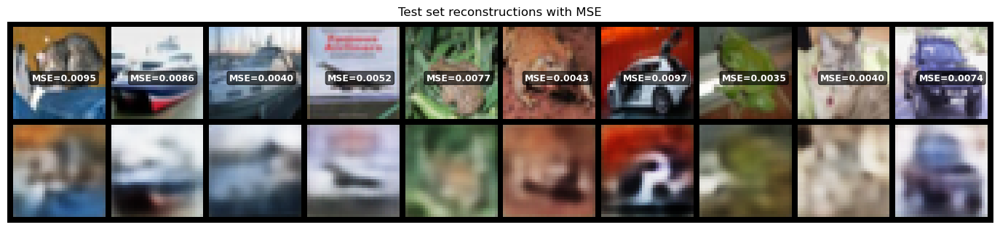

In [40]:
import torch
import torch.nn.functional as F
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

@torch.no_grad()
def show_reconstructions(model, loader, n=8, device=None, save_path=None, title="Reconstructions with Errors"):
    """
    Displays originals (top) and reconstructions (bottom) for n samples from the first batch,
    with per-image reconstruction errors (MSE) printed above each column.
    """
    device = device or next(model.parameters()).device
    model.eval()

    # get one mini-batch
    X, _ = next(iter(loader))
    X = X.to(device)[:n]

    # forward pass
    _, X_hat, _ = model(X)

    # compute per-sample MSE over pixels
    errors = F.mse_loss(X_hat, X, reduction="none")
    errors = errors.view(errors.size(0), -1).mean(dim=1).detach().cpu().numpy()

    # make two-row grid (originals on top, recons below)
    both = torch.cat([X, X_hat.clamp(0, 1)], dim=0)
    grid = make_grid(both, nrow=n, padding=2)

    # Plot grid
    plt.figure(figsize=(1.8 * n, 3.6))
    plt.imshow(grid.permute(1, 2, 0).detach().cpu())
    plt.axis("off")
    plt.title(title)

    # Annotate with reconstruction error above each column
    for i, err in enumerate(errors):
        plt.text(
            x=i * (grid.shape[2] / n) + 8,   # roughly column position
            y=20,
            s=f"MSE={err:.4f}",
            color="white",
            fontsize=9,
            weight="bold",
            bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.2")
        )

    if save_path is not None:
        plt.savefig(save_path, bbox_inches="tight", dpi=200)
    plt.show()

# Example usage:
show_reconstructions(ae_model, test_loader, n=10, title="Test set reconstructions with MSE")


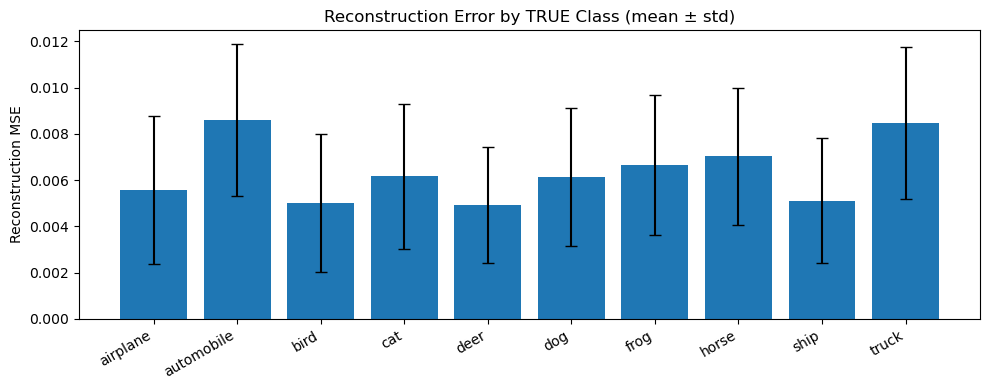

/scratch/local/33202463/ipykernel_1735205/2131196483.py:54: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_per_class, labels=labels, showfliers=False)


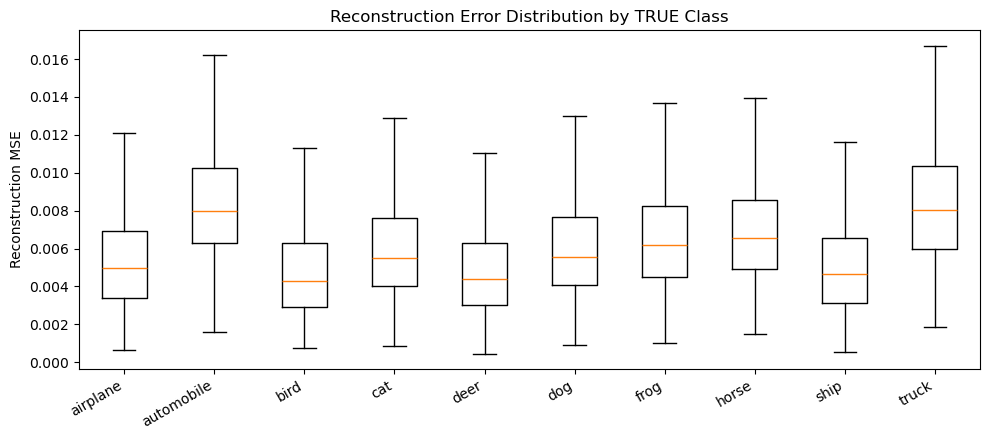

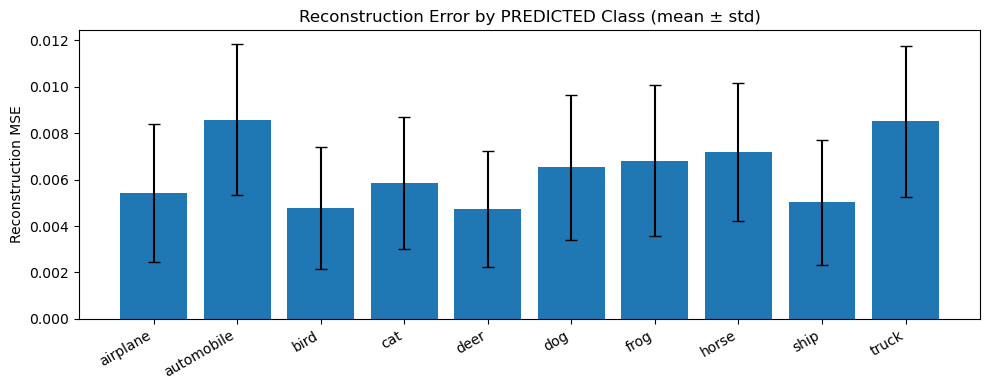

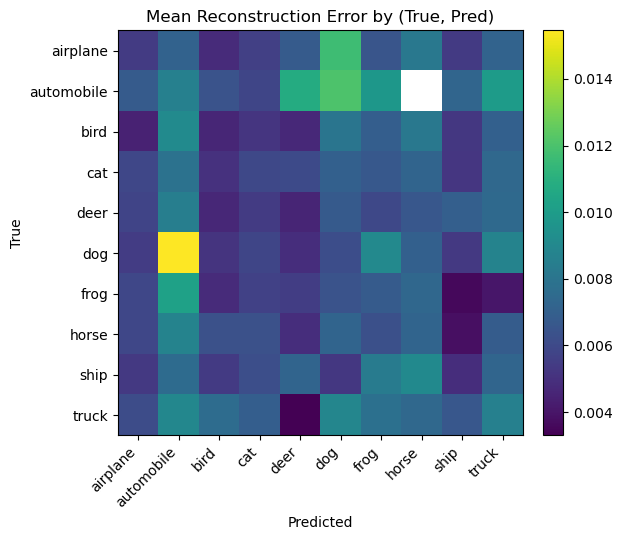

In [41]:
# ===================== Reconstruction Error by Class (CIFAR-10) =====================
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# CIFAR-10 class names (adjust if different)
cifar10_names = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

device = next(ae_model.parameters()).device
ae_model.eval()

@torch.no_grad()
def collect_errors_labels(model, loader, device):
    errs, y_true, y_pred = [], [], []
    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True)
        z, x_hat, logits = model(xb)
        e = F.mse_loss(x_hat, xb, reduction="none").view(xb.size(0), -1).mean(dim=1)
        errs.append(e.cpu())
        y_true.append(yb.cpu())
        y_pred.append(logits.argmax(1).cpu())
    errs  = torch.cat(errs).numpy().astype(np.float32)
    ytrue = torch.cat(y_true).numpy()
    ypred = torch.cat(y_pred).numpy()
    return errs, ytrue, ypred

# Use your desired split (validation/test)
err_val, y_val, yhat_val = collect_errors_labels(ae_model, valid_loader, device)

num_classes = int(max(y_val.max(), yhat_val.max()) + 1)
labels = cifar10_names if len(cifar10_names) == num_classes else [f"class_{i}" for i in range(num_classes)]

# ---------- 1) Bar chart: mean ± std by TRUE class ----------
means = np.zeros(num_classes, dtype=np.float32)
stds  = np.zeros(num_classes, dtype=np.float32)
for c in range(num_classes):
    mask = (y_val == c)
    means[c] = err_val[mask].mean() if mask.any() else np.nan
    stds[c]  = err_val[mask].std()  if mask.any() else np.nan

plt.figure(figsize=(10, 4))
x = np.arange(num_classes)
plt.bar(x, means, yerr=stds, capsize=4)
plt.xticks(x, labels, rotation=30, ha='right')
plt.ylabel("Reconstruction MSE")
plt.title("Reconstruction Error by TRUE Class (mean ± std)")
plt.tight_layout()
plt.show()

# ---------- 2) Boxplots per TRUE class (distribution view) ----------
data_per_class = [err_val[y_val == c] for c in range(num_classes)]
plt.figure(figsize=(10, 4.5))
plt.boxplot(data_per_class, labels=labels, showfliers=False)
plt.xticks(rotation=30, ha='right')
plt.ylabel("Reconstruction MSE")
plt.title("Reconstruction Error Distribution by TRUE Class")
plt.tight_layout()
plt.show()

# ---------- 3) (Optional) Bar chart by PREDICTED class ----------
means_pred = np.zeros(num_classes, dtype=np.float32)
stds_pred  = np.zeros(num_classes, dtype=np.float32)
for c in range(num_classes):
    mask = (yhat_val == c)
    means_pred[c] = err_val[mask].mean() if mask.any() else np.nan
    stds_pred[c]  = err_val[mask].std()  if mask.any() else np.nan

plt.figure(figsize=(10, 4))
x = np.arange(num_classes)
plt.bar(x, means_pred, yerr=stds_pred, capsize=4)
plt.xticks(x, labels, rotation=30, ha='right')
plt.ylabel("Reconstruction MSE")
plt.title("Reconstruction Error by PREDICTED Class (mean ± std)")
plt.tight_layout()
plt.show()

# ---------- 4) (Optional) TRUE x PRED heatmap of mean errors ----------
# useful to see where recon error spikes (e.g., true 'cat' predicted 'dog')
M = np.full((num_classes, num_classes), np.nan, dtype=np.float32)
for t in range(num_classes):
    for p in range(num_classes):
        m = (y_val == t) & (yhat_val == p)
        if m.any():
            M[t, p] = err_val[m].mean()

plt.figure(figsize=(6.5, 5.5))
im = plt.imshow(M, interpolation='nearest')
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(num_classes), labels, rotation=45, ha='right')
plt.yticks(range(num_classes), labels)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Mean Reconstruction Error by (True, Pred)")
plt.tight_layout()
plt.show()
# =====================================================================


## 2D latent visualization
### TSNE

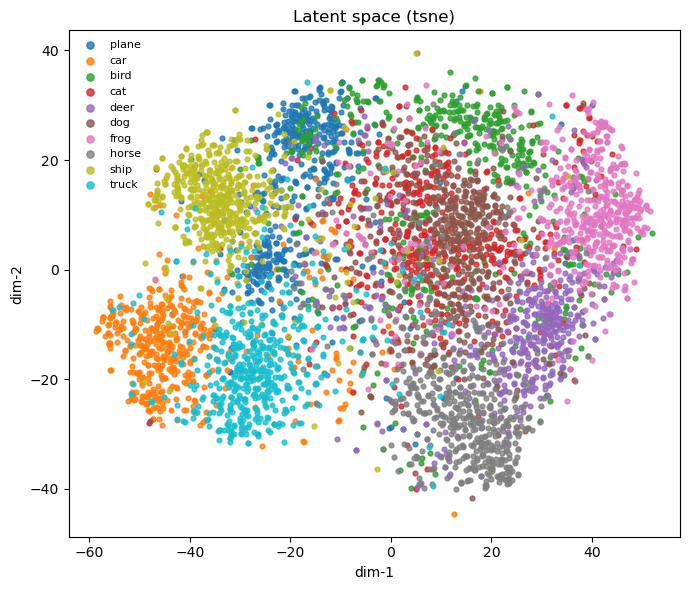

In [21]:

# --------------------------------
# 3) Extract latents (z) + labels
# --------------------------------
@torch.no_grad()
def extract_latents(model, loader, device=None):
    """
    Returns:
        Z: (N, latent_dim) tensor on CPU
        y: (N,) tensor of labels on CPU
    """
    device = device or next(model.parameters()).device
    model.eval()
    Z_list, y_list = [], []
    for X, y in loader:
        X = X.to(device)
        z, _, _ = model(X)
        Z_list.append(z.detach().cpu())
        y_list.append(y.detach().cpu())
    Z = torch.cat(Z_list, dim=0)
    y = torch.cat(y_list, dim=0)
    return Z, y


# --------------------------------------------
# 4) Reduce to 2D (PCA/TSNE) and scatter-plot
# --------------------------------------------
def plot_latent_2d(Z, y, method='pca', title=None, max_points=None, class_names=None):
    """
    Z: (N, D) tensor or numpy
    y: (N,) tensor or numpy (class ids)
    method: 'pca' or 'tsne'
    class_names: list of class names (len = num_classes)
    """
    import numpy as np
    import matplotlib.pyplot as plt

    Z = Z.detach().cpu().numpy() if hasattr(Z, "detach") else np.asarray(Z)
    y = y.detach().cpu().numpy() if hasattr(y, "detach") else np.asarray(y)

    if max_points is not None and Z.shape[0] > max_points:
        idx = np.random.choice(Z.shape[0], max_points, replace=False)
        Z, y = Z[idx], y[idx]

    # --- Embedding step ---
    if method.lower() == 'pca':
        from sklearn.decomposition import PCA
        emb = PCA(n_components=2).fit_transform(Z)
    elif method.lower() == 'tsne':
        from sklearn.manifold import TSNE
        emb = TSNE(n_components=2, init='pca', learning_rate='auto').fit_transform(Z)
    else:
        raise ValueError("method must be 'pca' or 'tsne'")

    # --- Plotting ---
    plt.figure(figsize=(7, 6))
    unique_classes = np.unique(y)
    for cls in unique_classes:
        mask = (y == cls)
        label = class_names[cls] if class_names is not None and cls < len(class_names) else str(cls)
        plt.scatter(emb[mask, 0], emb[mask, 1], s=12, alpha=0.8, label=label)
    plt.xlabel("dim-1")
    plt.ylabel("dim-2")
    plt.title(title or f"Latent 2D ({method.upper()})")
    plt.legend(markerscale=1.5, fontsize=8, loc='best', frameon=False)
    plt.tight_layout()
    plt.show()
    
# Latents + 2D visualization
Z, y = extract_latents(ae_model, test_loader)
plot_latent_2d(Z, y, method='tsne', title="Latent space (tsne)", max_points=5000, class_names=cifar10_classes)


### PCA

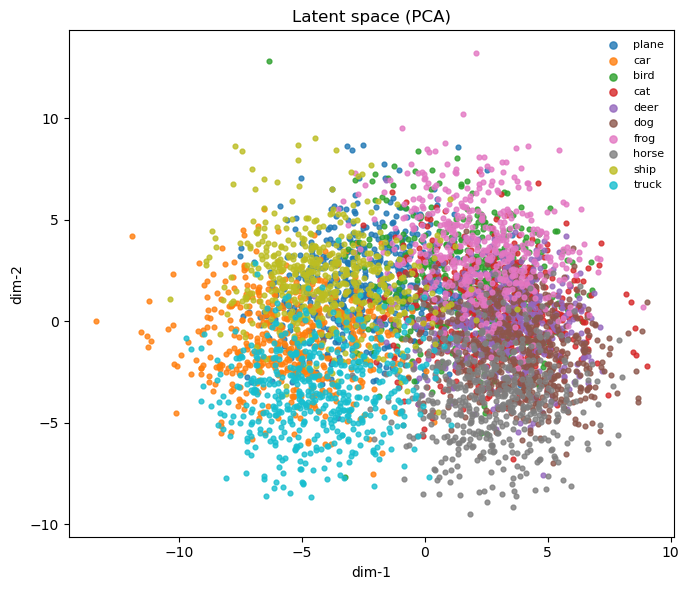

In [22]:
plot_latent_2d(Z, y, method='pca', title="Latent space (PCA)", max_points=5000, class_names=cifar10_classes)

### UMAP

/storage/homefs/ae04q066/.conda/envs/py3.10/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


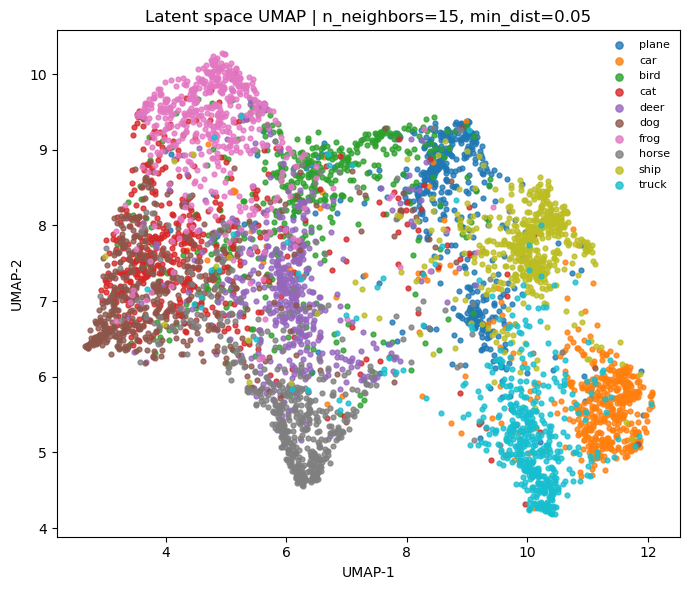

/storage/homefs/ae04q066/.conda/envs/py3.10/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


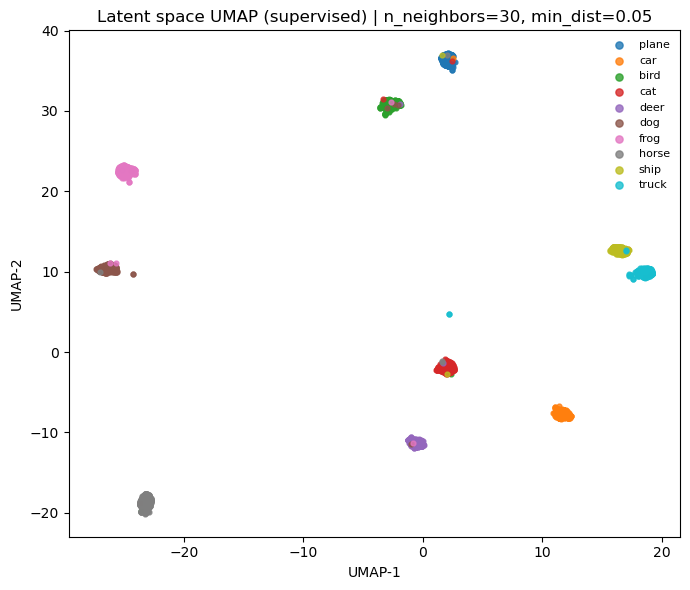

array([[ -2.9479084,  30.866644 ],
       [  1.7417781,  -2.1112874],
       [  2.1029582,  36.68014  ],
       ...,
       [ 18.879568 ,   9.728136 ],
       [-25.302994 ,  22.42908  ],
       [-22.935604 , -17.923094 ]], shape=(5000, 2), dtype=float32)

In [23]:
# --------------------------------
# 3) Extract latents (z) + labels
# --------------------------------
@torch.no_grad()
def extract_latents(model, loader, device=None):
    """
    Returns:
        Z: (N, latent_dim) tensor on CPU
        y: (N,) tensor of labels on CPU
    """
    device = device or next(model.parameters()).device
    model.eval()
    Z_list, y_list = [], []
    for X, y in loader:
        X = X.to(device)
        # expects model(X) -> (z, ..., ...)
        z, _, _ = model(X)
        Z_list.append(z.detach().cpu())
        y_list.append(y.detach().cpu())
    Z = torch.cat(Z_list, dim=0)
    y = torch.cat(y_list, dim=0)
    return Z, y


# ------------------------------------------------
# 4) Reduce to 2D with UMAP and scatter-plot
# ------------------------------------------------
def plot_latent_umap(
    Z, y,
    n_neighbors: int = 15,
    min_dist: float = 0.1,
    metric: str = "euclidean",
    random_state: int = 42,
    max_points: int | None = None,
    class_names: list[str] | None = None,
    supervised: bool = False,
):
    """
    Z: (N, D) tensor or numpy
    y: (N,) tensor or numpy (class ids)
    supervised: if True, use labels to guide UMAP (can improve separation)
    """
    import numpy as np
    import matplotlib.pyplot as plt

    try:
        import umap
    except ImportError as e:
        raise ImportError(
            "umap-learn is not installed. Install with: pip install umap-learn"
        ) from e

    Z = Z.detach().cpu().numpy() if hasattr(Z, "detach") else np.asarray(Z)
    y = y.detach().cpu().numpy() if hasattr(y, "detach") else np.asarray(y)

    if max_points is not None and Z.shape[0] > max_points:
        idx = np.random.choice(Z.shape[0], max_points, replace=False)
        Z, y = Z[idx], y[idx]

    reducer = umap.UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric=metric,
        random_state=random_state,
        verbose=False,
    )

    emb = reducer.fit_transform(Z, y=y if supervised else None)

    # --- Plotting ---
    plt.figure(figsize=(7, 6))
    unique_classes = np.unique(y)
    for cls in unique_classes:
        mask = (y == cls)
        label = (
            class_names[cls] if class_names is not None and cls < len(class_names)
            else str(cls)
        )
        plt.scatter(emb[mask, 0], emb[mask, 1], s=12, alpha=0.8, label=label)
    plt.xlabel("UMAP-1")
    plt.ylabel("UMAP-2")
    sup_txt = " (supervised)" if supervised else ""
    plt.title(f"Latent space UMAP{sup_txt} | n_neighbors={n_neighbors}, min_dist={min_dist}")
    plt.legend(markerscale=1.5, fontsize=8, loc='best', frameon=False)
    plt.tight_layout()
    plt.show()
    return emb  # returned in case you want to reuse the 2D coords

# Latents + 2D UMAP visualization
Z, y = extract_latents(ae_model, test_loader)

# Unsupervised UMAP
plot_latent_umap(Z, y, n_neighbors=15, min_dist=0.05, max_points=5000, class_names=cifar10_classes)

# Supervised UMAP (often yields cleaner class separation)
plot_latent_umap(Z, y, n_neighbors=30, min_dist=0.05, supervised=True, max_points=5000, class_names=cifar10_classes)


# Outliers

In [33]:
# TODO: plot the color histogram of worst and best

N=10000  min=0.000461  median=0.005817  max=0.038577
Threshold @ top 5.0% = 0.012449


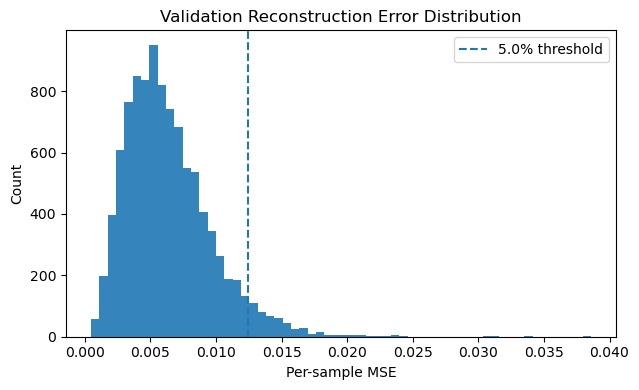

Per-class thresholds computed (using ground-truth labels).
Showing worst 500 (~5.0%).


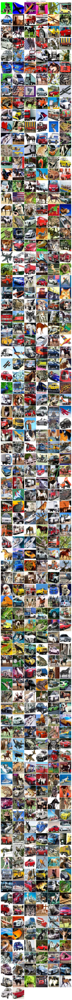

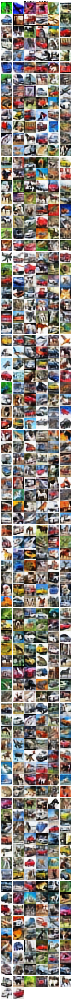

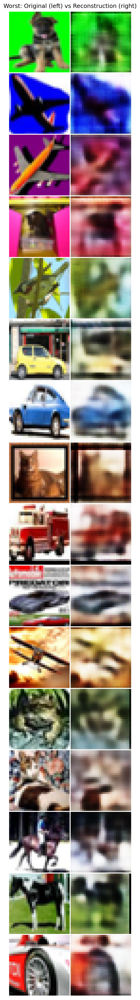

Showing best 500 (~5.0%).


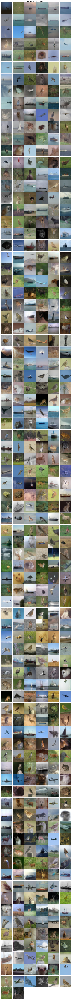

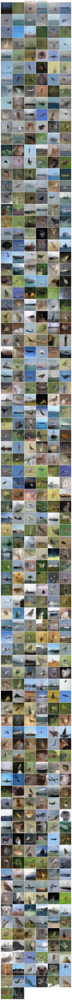

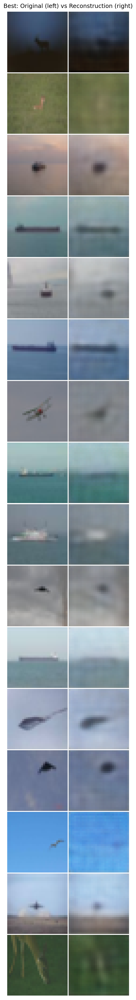

High-error rate (global) = 5.00%
Mean error by class (lower is better):
cls
4    0.004927
2    0.004995
8    0.005109
0    0.005559
5    0.006126
3    0.006163
6    0.006642
7    0.007021
9    0.008476
1    0.008603
Name: error, dtype: float32


In [31]:
# ====================== Recon Error + Histogram + Best/Worst Viz ======================
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# --- 0) Model/device ---
device = next(ae_model.parameters()).device
ae_model.eval()

# --- 1) Helper: run model and cache errors + images + preds ---
@torch.no_grad()
def recon_errors_and_images_supervisedAE(model, loader, device):
    """
    For SupervisedAE.forward -> (z, x_hat, logits)
    Returns:
        errs:   (N,) tensor   - per-sample MSE
        imgs:   (N, C, H, W)  - originals (CPU)
        recons: (N, C, H, W)  - reconstructions (CPU)
        y_true: (N,) or None
        y_pred: (N,) or None
    """
    errs, imgs, recons, y_true, y_pred = [], [], [], [], []

    for batch in loader:
        if isinstance(batch, (list, tuple)) and len(batch) == 2:
            xb, yb = batch
        else:
            xb, yb = batch, None

        xb = xb.to(device, non_blocking=True)
        z, x_hat, logits = model(xb)  # YOUR order

        # per-sample mean squared error over pixels
        e = F.mse_loss(x_hat, xb, reduction="none")
        e = e.view(e.size(0), -1).mean(dim=1)

        errs.append(e.detach().cpu())
        imgs.append(xb.detach().cpu())
        recons.append(x_hat.detach().cpu())

        if yb is not None:
            y_true.append(yb.detach().cpu())
            y_pred.append(logits.argmax(dim=1).detach().cpu())

    errs   = torch.cat(errs, 0)
    imgs   = torch.cat(imgs, 0)
    recons = torch.cat(recons, 0)
    y_true = torch.cat(y_true, 0) if len(y_true) else None
    y_pred = torch.cat(y_pred, 0) if len(y_pred) else None
    return errs, imgs, recons, y_true, y_pred

# --- 2) Helper: pretty grid with size controls ---
def show_grid(img_batch, title="", nrow=6, normalize=True, value_range=(0,1), scale=2.2, dpi=150, upsample=4):
    """
    img_batch: (N, C, H, W) tensor on CPU
    nrow:      images per row
    scale:     multiplies rendered figure size (inches)
    dpi:       dots-per-inch
    upsample:  integer factor to enlarge tiles before arranging (1 keeps 32x32)
    """
    x = img_batch
    if upsample > 1:
        x = torch.nn.functional.interpolate(x, scale_factor=upsample, mode="nearest")

    grid = make_grid(x, nrow=nrow, normalize=normalize, value_range=value_range, padding=2, pad_value=1.0)
    grid_np = grid.permute(1, 2, 0).numpy()
    h, w = grid_np.shape[:2]
    fig_w = (w / dpi) * scale
    fig_h = (h / dpi) * scale

    plt.figure(figsize=(fig_w, fig_h), dpi=dpi)
    plt.title(title)
    plt.imshow(grid_np, interpolation="nearest")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# --- 3) Compute reconstruction errors on validation set ---
err_val, X_val, Xhat_val, y_val, yhat_val = recon_errors_and_images_supervisedAE(ae_model, valid_loader, device)
print(f"N={len(err_val)}  min={err_val.min().item():.6f}  "
      f"median={err_val.median().item():.6f}  max={err_val.max().item():.6f}")

errors_np = err_val.numpy()

# --- 4) Histogram + percentile threshold ---
TOP_PERCENT = 5.0  # choose 1.0–10.0 typically
thr = np.percentile(errors_np, 100 - TOP_PERCENT)
print(f"Threshold @ top {TOP_PERCENT:.1f}% = {thr:.6f}")

plt.figure(figsize=(6.5, 4.0))
plt.hist(errors_np, bins=60, alpha=0.9)
plt.axvline(thr, linestyle="--", label=f"{TOP_PERCENT:.1f}% threshold")
plt.title("Validation Reconstruction Error Distribution")
plt.xlabel("Per-sample MSE")
plt.ylabel("Count")
plt.legend()
plt.tight_layout()
plt.show()

# --- (Optional) Per-class thresholds (if labels available) ---
perclass_thr = None
if y_val is not None:
    num_classes = int((yhat_val.max().item() if yhat_val is not None else y_val.max().item()) + 1)
    perclass_thr = np.zeros(num_classes, dtype=np.float32)
    for c in range(num_classes):
        mask = (y_val.numpy() == c)
        perclass_thr[c] = np.percentile(errors_np[mask], 100 - TOP_PERCENT) if mask.any() else thr
    print("Per-class thresholds computed (using ground-truth labels).")

# --- 5) WORST (highest-error) reconstructions ---
K_WORST_PERCENT = 5.0
K_worst = max(1, int(len(errors_np) * K_WORST_PERCENT / 100.0))
idx_desc = np.argsort(-errors_np)  # high -> low
worst_idx = idx_desc[:K_worst]
print(f"Showing worst {K_worst} (~{K_WORST_PERCENT:.1f}%).")

show_grid(X_val[worst_idx],     title="Worst (Highest Error) — Originals",       nrow=6, upsample=4, scale=2.0)
show_grid(Xhat_val[worst_idx],  title="Worst (Highest Error) — Reconstructions", nrow=6, upsample=4, scale=2.0)

# Side-by-side (original, recon)
N_PAIRS_W = min(16, K_worst)
pairs_w = torch.stack([X_val[worst_idx[:N_PAIRS_W]], Xhat_val[worst_idx[:N_PAIRS_W]]], dim=1).view(-1, *X_val.shape[1:])
show_grid(pairs_w, title="Worst: Original (left) vs Reconstruction (right)", nrow=2, upsample=4, scale=2.2)

# --- 6) BEST (lowest-error) reconstructions ---
K_BEST_PERCENT = 5.0
K_best = max(1, int(len(errors_np) * K_BEST_PERCENT / 100.0))
idx_asc = np.argsort(errors_np)  # low -> high
best_idx = idx_asc[:K_best]
print(f"Showing best {K_best} (~{K_BEST_PERCENT:.1f}%).")

show_grid(X_val[best_idx],     title="Best (Lowest Error) — Originals",       nrow=6, upsample=4, scale=2.0)
show_grid(Xhat_val[best_idx],  title="Best (Lowest Error) — Reconstructions", nrow=6, upsample=4, scale=2.0)

# Side-by-side (original, recon)
N_PAIRS_B = min(16, K_best)
pairs_b = torch.stack([X_val[best_idx[:N_PAIRS_B]], Xhat_val[best_idx[:N_PAIRS_B]]], dim=1).view(-1, *X_val.shape[1:])
show_grid(pairs_b, title="Best: Original (left) vs Reconstruction (right)", nrow=2, upsample=4, scale=2.2)

# --- 7) Boolean mask for downstream filtering (global percentile threshold) ---
is_high_error = errors_np > thr
print(f"High-error rate (global) = {is_high_error.mean()*100:.2f}%")
high_err_idx = np.where(is_high_error)[0]

# --- (Optional) quick class diagnostics if labels available ---
try:
    import pandas as pd
    if y_val is not None:
        df = pd.DataFrame({"error": errors_np, "cls": y_val.numpy()})
        print("Mean error by class (lower is better):")
        print(df.groupby("cls")["error"].mean().sort_values())
except Exception as e:
    print("Class diagnostics skipped:", e)
# ===============================================================================

# Notes:
# - If you trained with BCE, replace the MSE block with per-sample BCE:
#   e = F.binary_cross_entropy(x_hat, xb, reduction="none").view(xb.size(0), -1).mean(dim=1)
# - Keep the error scale consistent with your training input scale (e.g., if you standardized).


=== Classification Report (overall) ===
              precision    recall  f1-score   support

     class_0     0.8155    0.8032    0.8093       996
     class_1     0.8452    0.8882    0.8662      1002
     class_2     0.7050    0.7272    0.7159       986
     class_3     0.6421    0.5918    0.6159       970
     class_4     0.7653    0.7437    0.7543      1026
     class_5     0.6741    0.6887    0.6813       967
     class_6     0.8446    0.8546    0.8496      1011
     class_7     0.8221    0.8127    0.8174      1052
     class_8     0.8583    0.8669    0.8625       999
     class_9     0.8387    0.8446    0.8416       991

    accuracy                         0.7832     10000
   macro avg     0.7811    0.7822    0.7814     10000
weighted avg     0.7821    0.7832    0.7825     10000



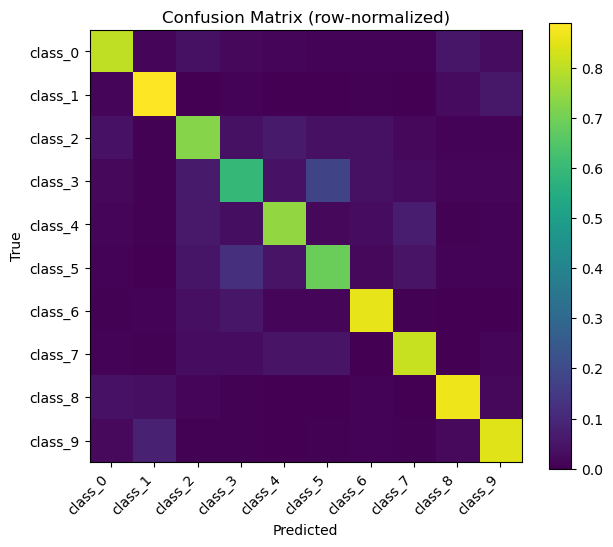

Overall accuracy: 78.32%


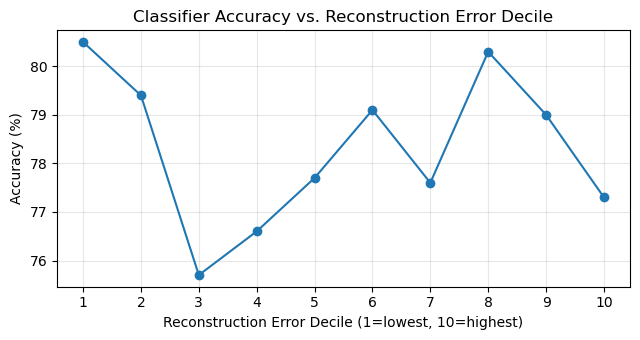

Accuracy on LOW-error (<= thr):  78.44%  (n=9500)
Accuracy on HIGH-error (>  thr): 76.00%  (n=500)
AUROC (error predicts misclassification): 0.5016
AUPR  (error predicts misclassification): 0.2217


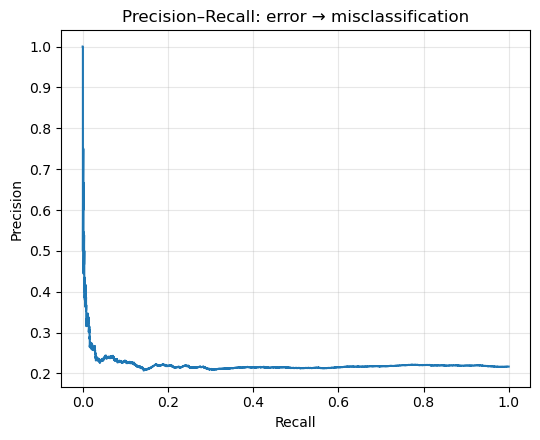


Mean reconstruction error by TRUE class:
true
4    0.004927
2    0.004995
8    0.005109
0    0.005559
5    0.006126
3    0.006163
6    0.006642
7    0.007021
9    0.008476
1    0.008603
Name: err, dtype: float32

Mean reconstruction error by PRED class:
pred
4    0.004737
2    0.004763
8    0.005031
0    0.005415
3    0.005860
5    0.006527
6    0.006825
7    0.007188
9    0.008522
1    0.008583
Name: err, dtype: float32


In [32]:
# ====================== Classification + Robustness Report ======================
import torch
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    roc_auc_score, precision_recall_curve, auc
)

# --- Ensure we have labels and preds (y_val, yhat_val). Recompute if needed. ---
def collect_labels_and_preds(model, loader, device):
    y_true_all, y_pred_all = [], []
    model.eval()
    with torch.no_grad():
        for batch in loader:
            if isinstance(batch, (list, tuple)) and len(batch) == 2:
                xb, yb = batch
            else:
                xb, yb = batch, None
            xb = xb.to(device, non_blocking=True)
            z, x_hat, logits = model(xb)
            if yb is not None:
                y_true_all.append(yb.cpu())
                y_pred_all.append(logits.argmax(dim=1).cpu())
    if y_true_all:
        return torch.cat(y_true_all, 0).numpy(), torch.cat(y_pred_all, 0).numpy()
    return None, None

if y_val is None or yhat_val is None:
    y_val_np, yhat_np = collect_labels_and_preds(ae_model, valid_loader, device)
else:
    y_val_np  = y_val.numpy()
    yhat_np   = yhat_val.numpy()

# Safety check
if y_val_np is None or yhat_np is None:
    raise RuntimeError("Need labels to produce a classification report (your loader must yield (x, y)).")

num_classes = int(max(y_val_np.max(), yhat_np.max()) + 1)
class_names = [f"class_{i}" for i in range(num_classes)]  # replace with your CIFAR-10 names if you want

# ------------------ 1) STANDARD CLASSIFICATION REPORT ------------------
print("=== Classification Report (overall) ===")
print(classification_report(y_val_np, yhat_np, target_names=class_names, digits=4))

# Confusion matrix (normalized by true class)
cm = confusion_matrix(y_val_np, yhat_np, labels=list(range(num_classes)))
cm_norm = cm / cm.sum(axis=1, keepdims=True).clip(min=1)

plt.figure(figsize=(6.5, 5.5))
plt.imshow(cm_norm, interpolation="nearest")
plt.title("Confusion Matrix (row-normalized)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.xticks(range(num_classes), class_names, rotation=45, ha="right")
plt.yticks(range(num_classes), class_names)
plt.tight_layout()
plt.show()

overall_acc = accuracy_score(y_val_np, yhat_np)
print(f"Overall accuracy: {overall_acc*100:.2f}%")

# ------------------ 2) ROBUSTNESS VS RECONSTRUCTION ERROR ------------------
# You already computed errors_np (per-sample MSE). Use it to see where the classifier struggles.
if 'errors_np' not in globals():
    raise RuntimeError("errors_np not found. Compute reconstruction errors first.")

# a) Accuracy in error bins (deciles)
quantiles = np.quantile(errors_np, np.linspace(0, 1, 11))
bins = np.digitize(errors_np, quantiles[1:-1], right=True)  # 10 bins: 0..9 (low->high error)
bin_acc = []
for b in range(10):
    mask = (bins == b)
    if mask.any():
        bin_acc.append(accuracy_score(y_val_np[mask], yhat_np[mask]))
    else:
        bin_acc.append(np.nan)

plt.figure(figsize=(6.5, 3.5))
plt.plot(range(1, 11), np.array(bin_acc)*100, marker="o")
plt.xticks(range(1, 11))
plt.xlabel("Reconstruction Error Decile (1=lowest, 10=highest)")
plt.ylabel("Accuracy (%)")
plt.title("Classifier Accuracy vs. Reconstruction Error Decile")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# b) Accuracy below/above your anomaly threshold (thr from previous cell)
if 'thr' in globals():
    low_mask  = errors_np <= thr
    high_mask = errors_np >  thr
    acc_low   = accuracy_score(y_val_np[low_mask],  yhat_np[low_mask])  if low_mask.any()  else np.nan
    acc_high  = accuracy_score(y_val_np[high_mask], yhat_np[high_mask]) if high_mask.any() else np.nan
    print(f"Accuracy on LOW-error (<= thr):  {acc_low*100:.2f}%  (n={low_mask.sum()})")
    print(f"Accuracy on HIGH-error (>  thr): {acc_high*100:.2f}%  (n={high_mask.sum()})")

# c) Does reconstruction error predict misclassification?
is_missed = (y_val_np != yhat_np).astype(np.uint8)   # 1 = misclassified (positive), 0 = correct
# AUROC: larger error should mean likelier misclassification
try:
    auroc = roc_auc_score(is_missed, errors_np)
    # PR curve (useful if misclassification is rare)
    prec, rec, thr_pr = precision_recall_curve(is_missed, errors_np)
    aupr = auc(rec, prec)
    print(f"AUROC (error predicts misclassification): {auroc:.4f}")
    print(f"AUPR  (error predicts misclassification): {aupr:.4f}")

    plt.figure(figsize=(5.5, 4.5))
    plt.plot(rec, prec)
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision–Recall: error → misclassification")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
except Exception as e:
    print("AUROC/AUPR calc skipped:", e)

# ------------------ 3) OPTIONAL: PER-CLASS BREAKDOWN VS ERROR ------------------
# Mean error per true class & per predicted class
try:
    import pandas as pd
    df = pd.DataFrame({"true": y_val_np, "pred": yhat_np, "err": errors_np})
    print("\nMean reconstruction error by TRUE class:")
    print(df.groupby("true")["err"].mean().sort_values())
    print("\nMean reconstruction error by PRED class:")
    print(df.groupby("pred")["err"].mean().sort_values())
except Exception as e:
    print("Per-class error breakdown skipped:", e)

# Notes:
# - You can replace class_names with CIFAR-10 names: 
#   ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']
# - For *true* OOD detection metrics, you need an OOD set (e.g., SVHN) and treat it as positives.
#   Then compute AUROC of `errors_np` between ID vs OOD.
# ================================================================================


In [34]:
import torch, numpy as np
import torch.nn.functional as F
from sklearn.metrics import roc_auc_score

@torch.no_grad()
def collect_logits(ae_model, loader, device):
    ae_model.eval()
    ys, yhat, all_logits = [], [], []
    for xb, yb in loader:
        xb = xb.to(device)
        z, x_hat, logits = ae_model(xb)
        all_logits.append(logits.cpu())
        ys.append(yb)
        yhat.append(logits.argmax(1).cpu())
    return torch.cat(ys).numpy(), torch.cat(yhat).numpy(), torch.cat(all_logits).numpy()

y_true, y_pred, logits = collect_logits(ae_model, valid_loader, next(ae_model.parameters()).device)
probs  = F.softmax(torch.from_numpy(logits), dim=1).numpy()
msp    = probs.max(axis=1)                   # higher = more confident
entropy= -(probs * np.log(np.clip(probs,1e-12,1))).sum(axis=1)
sort   = np.sort(logits, axis=1)
margin = sort[:,-1] - sort[:,-2]            # higher = more confident
energy = -np.log(np.exp(logits).sum(axis=1))# lower = more confident

is_missed = (y_true != y_pred).astype(np.uint8)
print("AUROC (1-MSP):", roc_auc_score(is_missed, 1-msp))
print("AUROC (entropy):", roc_auc_score(is_missed, entropy))
print("AUROC (-margin):", roc_auc_score(is_missed, -margin))
print("AUROC (-energy):", roc_auc_score(is_missed, -energy))


AUROC (1-MSP): 0.8470414450697111
AUROC (entropy): 0.8401763073906275
AUROC (-margin): 0.8377183538817002
AUROC (-energy): 0.2116580925449193


In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc

# features: recon error + logit-based confidence
X = np.c_[np.log1p(errors_np), 1-msp, entropy, -margin, -energy]
y = (y_true != y_pred).astype(np.uint8)   # 1 = misclassified

cal = LogisticRegression(max_iter=200, class_weight="balanced")
cal.fit(X, y)
p_err = cal.predict_proba(X)[:,1]

auroc = roc_auc_score(y, p_err)
prec, rec, _ = precision_recall_curve(y, p_err)
print(f"Calibrated meta-uncertainty AUROC: {auroc:.3f}, AUPR: {auc(rec,prec):.3f}")


Calibrated meta-uncertainty AUROC: 0.847, AUPR: 0.571


In [36]:
import torch.nn as nn, torch.optim as optim

class TempScaler(nn.Module):
    def __init__(self): super().__init__(); self.logT = nn.Parameter(torch.zeros(1))
    def forward(self, logits): return logits / self.logT.exp()

def fit_temp(logits_np, labels_np):
    logits_t = torch.from_numpy(logits_np).float()
    labels_t = torch.from_numpy(labels_np).long()
    Tm = TempScaler(); opt = optim.LBFGS(Tm.parameters(), lr=0.1, max_iter=50)
    ce = nn.CrossEntropyLoss()
    def closure():
        opt.zero_grad()
        loss = ce(Tm(logits_t), labels_t); loss.backward(); return loss
    opt.step(closure)
    return Tm

Tm = fit_temp(logits, y_true)
logits_cal = Tm(torch.from_numpy(logits).float()).detach().numpy()
probs_cal  = F.softmax(torch.from_numpy(logits_cal), dim=1).numpy()
msp_cal    = probs_cal.max(axis=1)
print("AUROC (1-MSP, temp-scaled):", roc_auc_score(is_missed, 1-msp_cal))


AUROC (1-MSP, temp-scaled): 0.8470418278780592


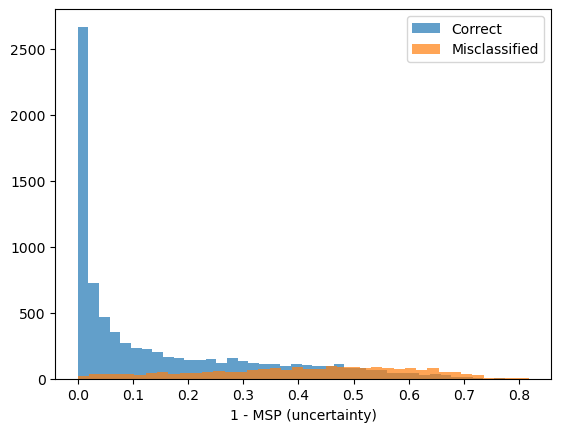

In [37]:
import matplotlib.pyplot as plt
plt.hist(1 - msp[y_true==y_pred], bins=40, alpha=0.7, label="Correct")
plt.hist(1 - msp[y_true!=y_pred], bins=40, alpha=0.7, label="Misclassified")
plt.legend(); plt.xlabel("1 - MSP (uncertainty)"); plt.show()


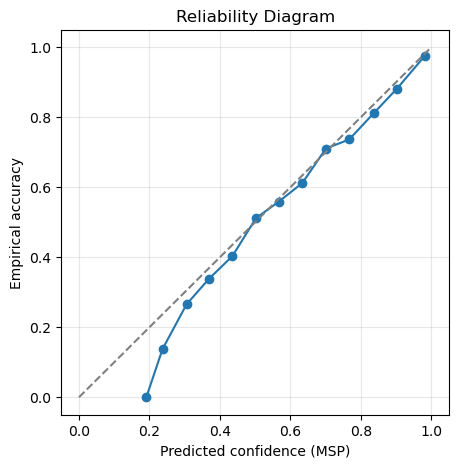

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

prob_true, prob_pred = calibration_curve((y_true==y_pred).astype(int), msp, n_bins=15)

plt.figure(figsize=(5,5))
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0,1],[0,1],'--',color='gray')
plt.xlabel("Predicted confidence (MSP)")
plt.ylabel("Empirical accuracy")
plt.title("Reliability Diagram")
plt.grid(alpha=0.3)
plt.show()


## Confusion matrix

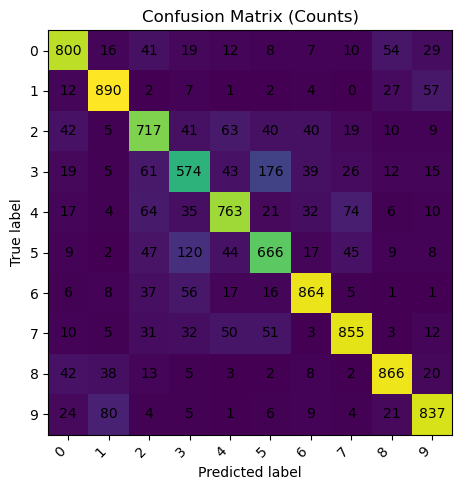

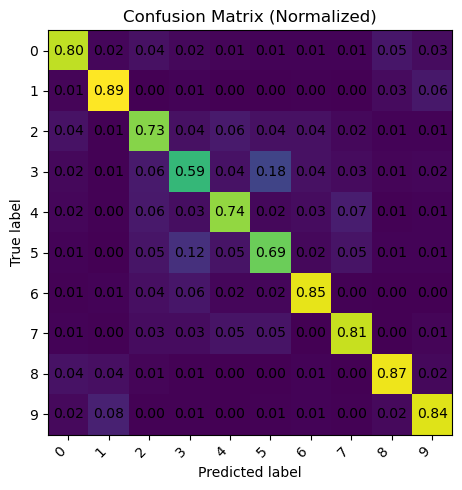

In [24]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

@torch.no_grad()
def confusion_matrix_eval(model, loader, device=None, normalize=None, class_names=None, title="Confusion Matrix"):
    """
    Compute and plot a confusion matrix.

    Args:
        model: your SupervisedAE (or any model returning logits)
        loader: dataloader with (X, y)
        device: torch device (inferred if None)
        normalize: None, 'true', 'pred', or 'all' (sklearn semantics)
        class_names: optional list of class names (len == num_classes)
        title: plot title

    Returns:
        cm: numpy array of shape (num_classes, num_classes)
    """
    device = device or next(model.parameters()).device
    model.eval()
    y_true, y_pred = [], []

    for X, y in loader:
        X = X.to(device)
        y_true.append(y.numpy())

        # Forward
        _, _, logits = model(X)
        preds = logits.argmax(dim=1).cpu().numpy()
        y_pred.append(preds)

    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred, normalize=normalize)

    # Plot (matplotlib only; no seaborn, no custom colors)
    fig, ax = plt.subplots(figsize=(6, 5))
    im = ax.imshow(cm)  # default colormap

    ax.set_title(title)
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")

    num_classes = cm.shape[0]
    if class_names is None:
        # Try to grab from dataset if available
        try:
            class_names = loader.dataset.classes
            if len(class_names) != num_classes:
                class_names = list(map(str, range(num_classes)))
        except Exception:
            class_names = list(map(str, range(num_classes)))

    ax.set_xticks(range(num_classes))
    ax.set_yticks(range(num_classes))
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    # Overlay values
    fmt = ".2f" if normalize else "d"
    thresh = cm.max() / 2.0 if cm.size else 0.0
    for i in range(num_classes):
        for j in range(num_classes):
            val = cm[i, j]
            ax.text(j, i, format(val, fmt),
                    ha="center", va="center")

    fig.tight_layout()
    plt.show()
    return cm

# No normalization (counts)
cm = confusion_matrix_eval(ae_model, valid_loader, normalize=None, title="Confusion Matrix (Counts)")

# Row-normalized (per true class recall)
cm_norm = confusion_matrix_eval(ae_model, valid_loader, normalize='true', title="Confusion Matrix (Normalized)")


Using downloaded and verified file: ./data/test_32x32.mat
[SVHN] OOD AUROC (1-MSP): 0.783
[SVHN] OOD AUPR  (1-MSP): 0.861
[SVHN] FPR@95%TPR:        48.86%


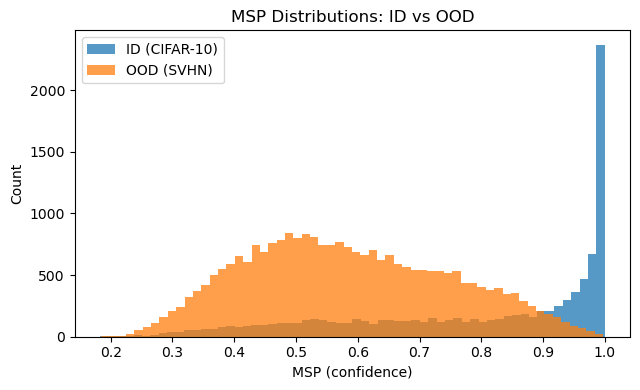

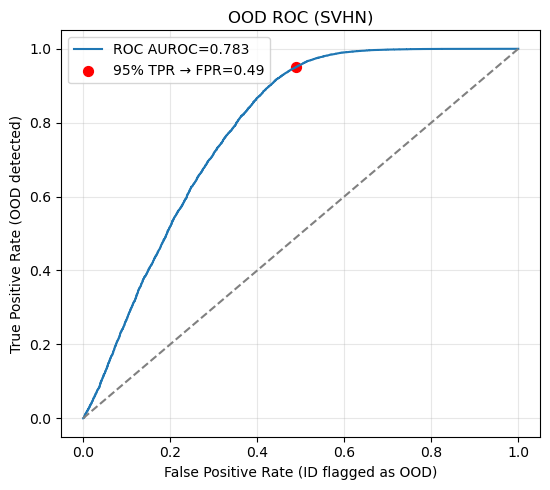

ID-only threshold (5th pct MSP): tau=0.391  →  FPR=5.00%,  TPR=12.26%


In [39]:
# ===================== OOD proof with MSP (no retraining) =====================
import torch, numpy as np, matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import datasets, transforms
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc, roc_curve

device = next(ae_model.parameters()).device
ae_model.eval()

# --- 1) Choose an OOD dataset (SVHN or CIFAR100). Use same transform as training. ---
# If you normalized during training, replace transforms.ToTensor() with your exact pipeline.
ood_name = "SVHN"   # change to "CIFAR100" if you prefer

if ood_name.upper() == "SVHN":
    ood_set = datasets.SVHN(root="./data", split="test",
                            transform=transforms.ToTensor(), download=True)
elif ood_name.upper() == "CIFAR100":
    ood_set = datasets.CIFAR100(root="./data", train=False,
                                transform=transforms.ToTensor(), download=True)
else:
    raise ValueError("ood_name must be 'SVHN' or 'CIFAR100'")

ood_loader = torch.utils.data.DataLoader(ood_set, batch_size=256, shuffle=False, num_workers=2, pin_memory=True)

# --- 2) Helper: collect MSP scores from a loader ---
@torch.no_grad()
def collect_msp_scores(model, loader, device):
    all_msp = []
    for batch in loader:
        xb = batch[0] if isinstance(batch, (list, tuple)) else batch
        xb = xb.to(device, non_blocking=True)
        _, _, logits = model(xb)
        probs = F.softmax(logits, dim=1)
        all_msp.append(probs.max(dim=1).values.detach().cpu())
    return torch.cat(all_msp).numpy()

# MSP on ID (CIFAR-10 validation) and OOD
msp_id  = collect_msp_scores(ae_model, valid_loader, device)
msp_ood = collect_msp_scores(ae_model, ood_loader, device)

# --- 3) Quantitative proof: AUROC, AUPR, FPR@95%TPR ---
scores = np.concatenate([msp_id, msp_ood])
labels = np.concatenate([np.zeros_like(msp_id), np.ones_like(msp_ood)])  # 0=ID, 1=OOD

# Use 1 - MSP so "higher = more OOD-like"
ood_score = 1.0 - scores

auroc = roc_auc_score(labels, ood_score)
prec, rec, _ = precision_recall_curve(labels, ood_score)
aupr = auc(rec, prec)

# FPR at 95% TPR (standard OOD metric)
fpr, tpr, thr = roc_curve(labels, ood_score)
target = 0.95
idx = np.argmin(np.abs(tpr - target))
fpr95 = fpr[idx]

print(f"[{ood_name}] OOD AUROC (1-MSP): {auroc:.3f}")
print(f"[{ood_name}] OOD AUPR  (1-MSP): {aupr:.3f}")
print(f"[{ood_name}] FPR@95%TPR:        {fpr95*100:.2f}%")

# --- 4) Visual proof: MSP histograms & ROC curve ---
plt.figure(figsize=(6.5,4))
plt.hist(msp_id,  bins=60, alpha=0.75, label="ID (CIFAR-10)")
plt.hist(msp_ood, bins=60, alpha=0.75, label=f"OOD ({ood_name})")
plt.xlabel("MSP (confidence)"); plt.ylabel("Count")
plt.title("MSP Distributions: ID vs OOD")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(5.6,5))
plt.plot(fpr, tpr, label=f"ROC AUROC={auroc:.3f}")
plt.plot([0,1],[0,1],'--',color='gray'); 
plt.scatter([fpr[idx]],[tpr[idx]], s=50, color='red', label=f"95% TPR → FPR={fpr95:.2f}")
plt.xlabel("False Positive Rate (ID flagged as OOD)")
plt.ylabel("True Positive Rate (OOD detected)")
plt.title(f"OOD ROC ({ood_name})"); plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

# --- 5) Optional: pick an MSP threshold from ID only and report operating point ---
tau = np.percentile(msp_id, 5)  # keep 95% of ID as "in"; <tau flagged as OOD
id_flag   = (msp_id  < tau)
ood_flag  = (msp_ood < tau)
fpr_oper  = id_flag.mean()                 # ID falsely flagged
tpr_oper  = ood_flag.mean()                # OOD correctly flagged
print(f"ID-only threshold (5th pct MSP): tau={tau:.3f}  →  FPR={fpr_oper*100:.2f}%,  TPR={tpr_oper*100:.2f}%")
# ===============================================================================


## Classification report

In [27]:
import torch
import numpy as np
from sklearn.metrics import classification_report

@torch.no_grad()
def classification_report_eval(model, loader, device=None, target_names=None,
                               digits=3, output_dict=False, print_report=True):
    """
    Compute a sklearn-style classification report.

    Args:
        model: your model returning (z, x_hat, logits)
        loader: DataLoader of (X, y)
        device: torch device (auto if None)
        target_names: list of class names (len == num_classes) or None to infer from dataset
        digits: number formatting for the report
        output_dict: if True, returns the sklearn dict; else returns the string
        print_report: if True, prints the report

    Returns:
        report (str or dict), y_true (np.ndarray), y_pred (np.ndarray)
    """
    device = device or next(model.parameters()).device
    model.eval()
    y_true, y_pred = [], []

    for X, y in loader:
        X = X.to(device)
        _, _, logits = model(X)
        preds = logits.argmax(dim=1).cpu().numpy()
        y_pred.append(preds)
        y_true.append(y.numpy())

    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)

    # class names
    if target_names is None:
        try:
            target_names = loader.dataset.classes
            if len(target_names) != model.num_classes:
                target_names = [str(i) for i in range(model.num_classes)]
        except Exception:
            target_names = [str(i) for i in range(model.num_classes)]

    rep = classification_report(
        y_true, y_pred, target_names=target_names,
        digits=digits, output_dict=output_dict, zero_division=0
    )

    if print_report and not output_dict:
        print(rep)
    elif print_report and output_dict:
        # pretty print a compact table from the dict
        import pandas as pd
        df = pd.DataFrame(rep).transpose()
        print(df.round(digits).to_string())

    return rep, y_true, y_pred

# simple printout
_ = classification_report_eval(ae_model, test_loader, print_report=True)

              precision    recall  f1-score   support

    airplane      0.790     0.808     0.799      1000
  automobile      0.873     0.876     0.874      1000
        bird      0.693     0.660     0.676      1000
         cat      0.637     0.564     0.598      1000
        deer      0.736     0.724     0.730      1000
         dog      0.663     0.708     0.685      1000
        frog      0.811     0.847     0.829      1000
       horse      0.815     0.826     0.821      1000
        ship      0.861     0.875     0.868      1000
       truck      0.843     0.852     0.847      1000

    accuracy                          0.774     10000
   macro avg      0.772     0.774     0.773     10000
weighted avg      0.772     0.774     0.773     10000

